In [9]:
import cv2
import numpy as np
import imageio
from IPython.display import Image, display

In [10]:
def dense_optical_flow(method, video_path, params=[], to_gray=False):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"无法打开视频文件: {video_path}")
        return

    ret, old_frame = cap.read()
    if not ret:
        print("无法读取视频帧！")
        return

    # 获取视频的宽度和高度
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # 创建HSV图像，并使Value为常量
    hsv = np.zeros_like(old_frame)
    hsv[..., 1] = 255

    # 精确方法的预处理
    if to_gray:
        old_frame = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)

    gif_frames = []  # 用于存储GIF的每一帧

    while True:
        ret, new_frame = cap.read()
        if not ret:
            break

        frame_copy = new_frame.copy()

        if to_gray:
            new_frame = cv2.cvtColor(new_frame, cv2.COLOR_BGR2GRAY)

        try:
            # 计算光流
            flow = method(old_frame, new_frame, None, *params)
        except Exception as e:
            print(f"光流计算出错: {e}")
            continue

        # 编码：将算法的输出转换为极坐标
        mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
        # 裁剪异常值
        mag = np.clip(mag, 0, 255)
        hsv[..., 0] = ang * 180 / np.pi / 2
        hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
        bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

        # 显式调整光流图像的大小以匹配原始帧
        bgr = cv2.resize(bgr, (width, height))

        # 将光流图像添加到GIF帧列表中
        bgr_rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)  # 转换为RGB格式，因为imageio使用RGB
        gif_frames.append(bgr_rgb)

        if to_gray:
            old_frame = new_frame

    cap.release()

    # 保存为GIF文件
    gif_path = "output_fast.gif"
    # 手动设置帧率
    fps = 30
    duration = 1000 / fps  # 每一帧的持续时间（毫秒）
    imageio.mimsave(gif_path, gif_frames, duration=duration)
    print(f"GIF文件已保存为 {gif_path}")
    # 在Jupyter Notebook中显示GIF图像
    display(Image(filename=gif_path))

In [11]:
def main():
    algorithm = "farneback"  # 选择算法：farneback, lucaskanade_dense, rlof
    video_path = "skating.mp4"  # 视频路径

    if algorithm == "lucaskanade_dense":
        method = cv2.optflow.calcOpticalFlowSparseToDense
        dense_optical_flow(method, video_path, to_gray=True)

    elif algorithm == "farneback":
        method = cv2.calcOpticalFlowFarneback
        params = [0.5, 3, 15, 3, 5, 1.2, 0]  # Farneback的算法参数
        dense_optical_flow(method, video_path, params, to_gray=True)

    elif algorithm == "rlof":
        method = cv2.optflow.calcOpticalFlowDenseRLOF
        dense_optical_flow(method, video_path)


GIF文件已保存为 output_fast.gif


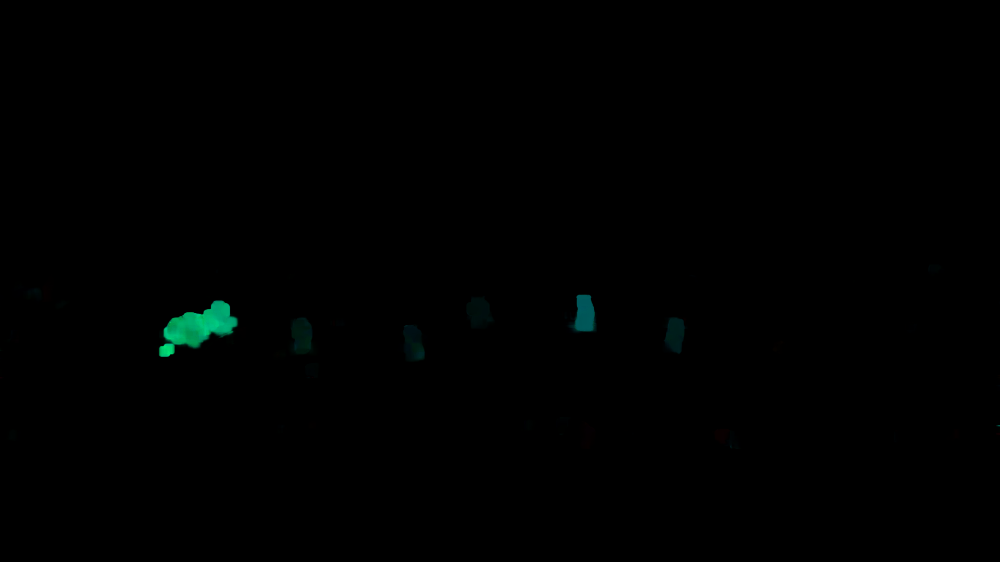

In [12]:
if __name__ == "__main__":
    main()